In [30]:
import os
import warnings

warnings.filterwarnings("ignore")  # avoid printing out absolute paths

os.chdir("../../..")

In [31]:
import copy
from pathlib import Path
import warnings

import numpy as np
import pandas as pd
import pytorch_lightning as pl
from pytorch_lightning.callbacks import EarlyStopping, LearningRateMonitor
from pytorch_lightning.loggers import TensorBoardLogger
import torch

from pytorch_forecasting import Baseline, TemporalFusionTransformer, TimeSeriesDataSet
from pytorch_forecasting.data import GroupNormalizer
from pytorch_forecasting.metrics import SMAPE, PoissonLoss, QuantileLoss
from pytorch_forecasting.models.temporal_fusion_transformer.tuning import optimize_hyperparameters


In [32]:
from pytorch_forecasting.data.examples import get_stallion_data

data = get_stallion_data()
print(data.columns.tolist())
print('현재 데이터 수', data.shape)

['agency', 'sku', 'volume', 'date', 'industry_volume', 'soda_volume', 'avg_max_temp', 'price_regular', 'price_actual', 'discount', 'avg_population_2017', 'avg_yearly_household_income_2017', 'easter_day', 'good_friday', 'new_year', 'christmas', 'labor_day', 'independence_day', 'revolution_day_memorial', 'regional_games', 'fifa_u_17_world_cup', 'football_gold_cup', 'beer_capital', 'music_fest', 'discount_in_percent', 'timeseries']
현재 데이터 수 (21000, 26)


잠재력이 높은 시장인 컨트리 비리스탄은 Stallion & Co.의 전 세계 맥주 판매의 거의 10%를 차지합니다. Stallion & Co.는 도매업체(대리점)를 통해 소매업체에 유통되는 광범위한 제품 포트폴리오를 보유하고 있습니다. 수천 개의 고유한 도매업체-SKU/제품 조합이 있습니다. 생산 및 유통을 계획하고 도매업체의 계획을 돕기 위해서는 Stallion & Co.가 각 도매업체의 SKU 수준에서 수요를 정확하게 추정하는 것이 중요합니다.

현재 수요는 일반적으로 시장에 대한 "느낌"이 있고 과거 경험을 기반으로 공급, 수요 및 기타 외부 요인의 힘의 순 효과를 예측하는 영업 임원에 의해 추정됩니다. 특정 시장에서 더 많은 경험을 가진 영업 담당자가 더 나은 평가 작업을 수행합니다. Stallion & Co.의 새로운 S&OP 책임자인 Joshua는 분석 과정을 수강하고 훨씬 더 효과적인 방법으로 예측을 수행할 수 있다는 것을 깨달았습니다. 그는 Stallion의 최고의 데이터 과학자인 당신에게 접근하여 수요 예측의 실행을 변화시킵니다.

* 'stallion'
* 'agency'
* 'sku':['상품명'],
* 'volume' 
* 'date'
* 'industry_volume'
*'soda_volume'
*'avg_max_temp'
*'price_regular'  
*'price_actual'  
*'discount'  
*'avg_population_2017'
*'avg_yearly_household_income_2017', 'easter_day', 'good_friday', *'new_year', 'christmas', 'labor_day', 'independence_day', *'revolution_day_memorial', 'regional_games', 'fifa_u_17_world_cup', *'football_gold_cup', 'beer_capital', 'music_fest', 'discount_in_percent', 'timeseries'

In [33]:
# add time index
data["time_idx"] = data["date"].dt.year * 12 + data["date"].dt.month
data["time_idx"] -= data["time_idx"].min()

# add additional features
data["month"] = data.date.dt.month.astype(str).astype("category")  # categories have be strings
data["log_volume"] = np.log(data.volume + 1e-8)
data["avg_volume_by_sku"] = data.groupby(["time_idx", "sku"], observed=True).volume.transform("mean")
data["avg_volume_by_agency"] = data.groupby(["time_idx", "agency"], observed=True).volume.transform("mean")


In [34]:
data['easter_day']

0       0
238     0
237     0
236     0
235     0
       ..
6765    0
6764    0
6763    0
6771    0
6650    0
Name: easter_day, Length: 21000, dtype: int64

In [35]:

# we want to encode special days as one variable and thus need to first reverse one-hot encoding
special_days = [
    "easter_day",
    "good_friday",
    "new_year",
    "christmas",
    "labor_day",
    "independence_day",
    "revolution_day_memorial",
    "regional_games",
    "fifa_u_17_world_cup",
    "football_gold_cup",
    "beer_capital",
    "music_fest",
]
data[special_days] = data[special_days].apply(lambda x: x.map({0: "-", 1: x.name})).astype("category")
data.sample(10, random_state=521)

,agency,sku,volume,date,industry_volume,soda_volume,avg_max_temp,price_regular,price_actual,discount,...,football_gold_cup,beer_capital,music_fest,discount_in_percent,timeseries,time_idx,month,log_volume,avg_volume_by_sku,avg_volume_by_agency
291,Agency_25,SKU_03,0.5076,2013-01-01,492612703,718394219,25.845238,1264.162234,1152.473405,111.688829,...,-,-,-,8.835008,228,0,1,-0.678062,1225.306376,99.650400
871,Agency_29,SKU_02,8.7480,2015-01-01,498567142,762225057,27.584615,1316.098485,1296.804924,19.293561,...,-,-,-,1.465966,177,24,1,2.168825,1634.434615,11.397086
19532,Agency_47,SKU_01,4.9680,2013-09-01,454252482,789624076,30.665957,1269.250000,1266.490490,2.759510,...,-,-,-,0.217413,322,8,9,1.603017,2625.472644,48.295650
2089,Agency_53,SKU_07,21.6825,2013-10-01,480693900,791658684,29.197727,1193.842373,1128.124395,65.717978,...,-,beer_capital,-,5.504745,240,9,10,3.076505,38.529107,2511.035175
9755,Agency_17,SKU_02,960.5520,2015-03-01,515468092,871204688,23.608120,1338.334248,1232.128069,106.206179,...,-,-,music_fest,7.935699,259,26,3,6.867508,2143.677462,396.022140
7561,Agency_05,SKU_03,1184.6535,2014-02-01,425528909,734443953,28.668254,1369.556376,1161.135214,208.421162,...,-,-,-,15.218151,21,13,2,7.077206,1566.643589,1881.866367
19204,Agency_11,SKU_05,5.5593,2017-08-01,623319783,1049868815,31.915385,1922.486644,1651.307674,271.178970,...,-,-,-,14.105636,17,55,8,1.715472,1385.225478,109.699200
8781,Agency_48,SKU_04,4275.1605,2013-03-01,509281531,892192092,26.767857,1761.258209,1546.059670,215.198539,...,-,-,music_fest,12.218455,151,2,3,8.360577,1757.950603,1925.272108
2540,Agency_07,SKU_21,0.0000,2015-10-01,544203593,761469815,28.987755,0.000000,0.000000,0.000000,...,-,-,-,0.000000,300,33,10,-18.420681,0.000000,2418.719550
12084,Agency_21,SKU_03,46.3608,2017-04-01,589969396,940912941,32.478910,1675.922116,1413.571789,262.350327,...,-,-,-,15.654088,181,51,4,3.836454,2034.293024,109.381800


In [36]:
data['easter_day'].unique()

['-', 'easter_day']
Categories (2, object): ['-', 'easter_day']

In [37]:
max_prediction_length = 6
max_encoder_length = 24
training_cutoff = data["time_idx"].max() - max_prediction_length

In [38]:
training = TimeSeriesDataSet(
    data[lambda x: x.time_idx <= training_cutoff],
    time_idx="time_idx",
    target="volume",
    group_ids=["agency", "sku"],
    min_encoder_length=max_encoder_length // 2,  # keep encoder length long (as it is in the validation set)
    max_encoder_length=max_encoder_length,
    min_prediction_length=1,
    max_prediction_length=max_prediction_length,
    static_categoricals=["agency", "sku"],
    static_reals=["avg_population_2017", "avg_yearly_household_income_2017"],
    time_varying_known_categoricals=["special_days", "month"],
    variable_groups={"special_days": special_days},  # group of categorical variables can be treated as one variable
    time_varying_known_reals=["time_idx", "price_regular", "discount_in_percent"],
    time_varying_unknown_categoricals=[],
    time_varying_unknown_reals=[
        "volume",
        "log_volume",
        "industry_volume",
        "soda_volume",
        "avg_max_temp",
        "avg_volume_by_agency",
        "avg_volume_by_sku",
    ],
    target_normalizer=GroupNormalizer(
        groups=["agency", "sku"], transformation="softplus"
    ),  # use softplus and normalize by group
    add_relative_time_idx=True,
    add_target_scales=True,
    add_encoder_length=True,
)

In [39]:
# create validation set (predict=True) which means to predict the last max_prediction_length points in time
# for each series
validation = TimeSeriesDataSet.from_dataset(training, data, predict=True, stop_randomization=True)

# create dataloaders for model
batch_size = 128  # set this between 32 to 128
train_dataloader = training.to_dataloader(train=True, batch_size=batch_size, num_workers=0)
val_dataloader = validation.to_dataloader(train=False, batch_size=batch_size * 10, num_workers=0)

In [40]:
import pytorch_lightning as pl

In [41]:
print(pl.__version__)

1.6.4


### Model

In [42]:

from pytorch_lightning.callbacks import EarlyStopping, LearningRateMonitor
from pytorch_lightning.loggers import TensorBoardLogger
from pytorch_forecasting.metrics import QuantileLoss
from pytorch_forecasting.models import TemporalFusionTransformer
# stop training, when loss metric does not improve on validation set
early_stop_callback = EarlyStopping(
    monitor="val_loss",
    min_delta=1e-4,
    patience=10,
    verbose=False,
    mode="min"
)

In [43]:
lr_logger = LearningRateMonitor()  # log the learning rate
logger = TensorBoardLogger("lightning_logs")  # log to tensorboard

In [50]:
# create trainer
trainer = pl.Trainer(
    accelerator = 'gpu',
    devices=1,
    max_epochs=30,
#    gpus=0,  # train on CPU, use gpus = [0] to run on GPU
    gradient_clip_val=0.1,
#    early_stop_callback=[],
    limit_train_batches=30,  # running validation every 30 batches
    # fast_dev_run=True,  # comment in to quickly check for bugs
    callbacks=[early_stop_callback, lr_logger],
    logger=logger,
)

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


In [51]:
# initialise model
tft = TemporalFusionTransformer.from_dataset(
    training,
    learning_rate=0.03,
    hidden_size=16,  # biggest influence network size
    attention_head_size=1,
    dropout=0.1,
    hidden_continuous_size=8,
    output_size=7,  # QuantileLoss has 7 quantiles by default
    loss=QuantileLoss(),
    log_interval=10,  # log example every 10 batches
    reduce_on_plateau_patience=4,  # reduce learning automatically
)

In [52]:
tft.size() # 29.6k parameters in model

29673

In [53]:
import tensorflow as tf
import tensorboard as tb
tf.io.gfile = tb.compat.tensorflow_stub.io.gfile

In [54]:
# fit network
trainer.fit(
    tft,
    train_dataloaders=train_dataloader,
    val_dataloaders=val_dataloader
)

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name                               | Type                            | Params
----------------------------------------------------------------------------------------
0  | loss                               | QuantileLoss                    | 0     
1  | logging_metrics                    | ModuleList                      | 0     
2  | input_embeddings                   | MultiEmbedding                  | 1.3 K 
3  | prescalers                         | ModuleDict                      | 256   
4  | static_variable_selection          | VariableSelectionNetwork        | 3.4 K 
5  | encoder_variable_selection         | VariableSelectionNetwork        | 8.0 K 
6  | decoder_variable_selection         | VariableSelectionNetwork        | 2.7 K 
7  | static_context_variable_selection  | GatedResidualNetwork            | 1.1 K 
8  | static_context_initial_hidden_lstm | GatedResidualNetwork            | 1.1 K 
9  | static_context_initial_cell_lstm 

Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

In [56]:
from pytorch_forecasting.metrics import MAE
# load the best model according to the validation loss (given that
# we use early stopping, this is not necessarily the last epoch)
best_model_path = trainer.checkpoint_callback.best_model_path
best_tft = TemporalFusionTransformer.load_from_checkpoint(best_model_path)
# calculate mean absolute error on validation set


In [86]:
actuals = torch.cat([y[0] for x, y_tuple in iter(val_dataloader)])

In [87]:
predictions = best_tft.predict(val_dataloader)

In [89]:
MAE.loss(predictions, actuals)

TypeError: loss() missing 1 required positional argument: 'target'

### smape

In [95]:
from pytorch_forecasting.metrics import SMAPE

In [96]:
best_tft.predict(val_dataloader)

tensor([[7.8731e+01, 7.8160e+01, 7.5754e+01, 7.6861e+01, 7.6694e+01, 7.3902e+01],
        [6.3291e+01, 6.1690e+01, 6.0604e+01, 6.2421e+01, 6.0768e+01, 5.7953e+01],
        [3.9010e+01, 3.8420e+01, 3.7542e+01, 3.8024e+01, 3.6858e+01, 3.4847e+01],
        ...,
        [1.9766e+03, 1.9637e+03, 1.9531e+03, 1.9669e+03, 1.9527e+03, 1.9267e+03],
        [7.0514e+01, 7.0318e+01, 6.9246e+01, 6.9586e+01, 6.9893e+01, 6.8509e+01],
        [2.0412e-12, 2.7719e-12, 8.8590e-13, 1.3844e-12, 1.2796e-12, 6.6221e-13]])

In [97]:
# calculate metric by which to display
predictions = best_tft.predict(val_dataloader)

In [98]:
mean_losses = SMAPE(reduction="none")(predictions, actuals).mean(1)

In [101]:
len(indices)

350

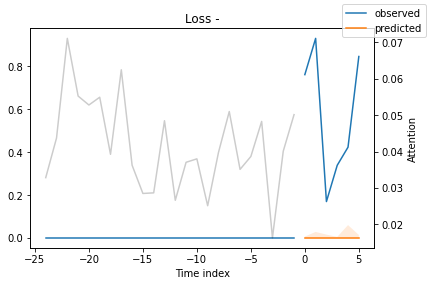

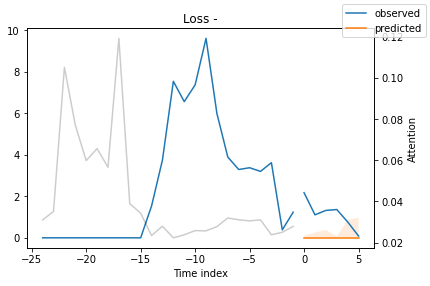

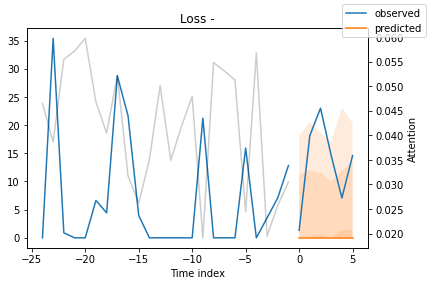

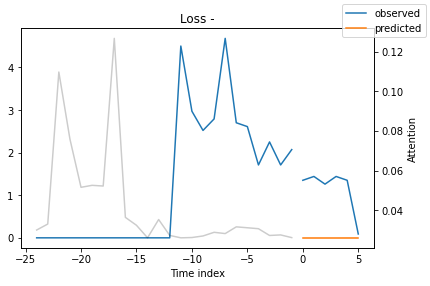

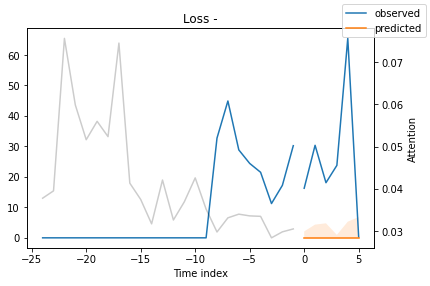

...

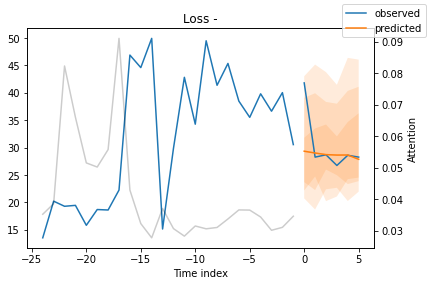

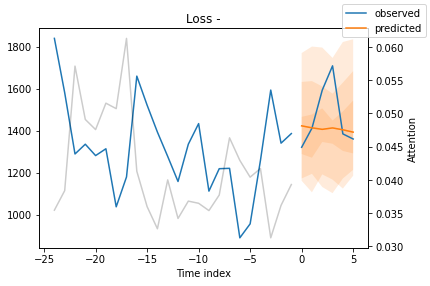

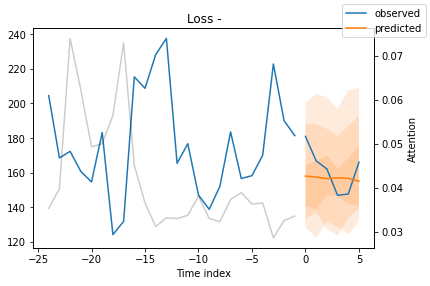

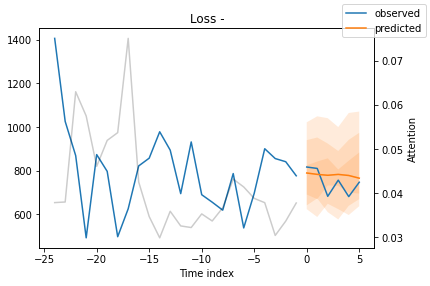

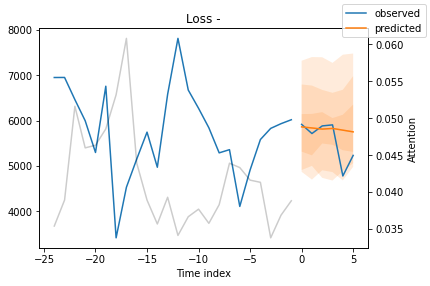

In [102]:
indices = mean_losses.argsort(descending=True)  # sort losses
raw_predictions, x = best_tft.predict(val_dataloader,
                                      mode="raw",
                                      return_x=True)
# show only two examples for demonstration purposes
for idx in range(350):
    best_tft.plot_prediction(
        x,
        raw_predictions,
        idx=indices[idx],
        add_loss_to_title=SMAPE()
    )

### Interpretation

{'attention': <Figure size 432x288 with 1 Axes>,
 'static_variables': <Figure size 504x270 with 1 Axes>,
 'encoder_variables': <Figure size 504x378 with 1 Axes>,
 'decoder_variables': <Figure size 504x252 with 1 Axes>}

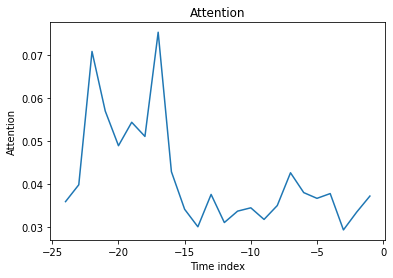

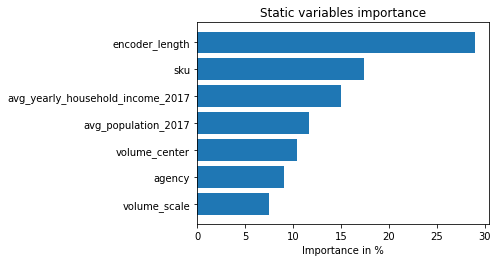

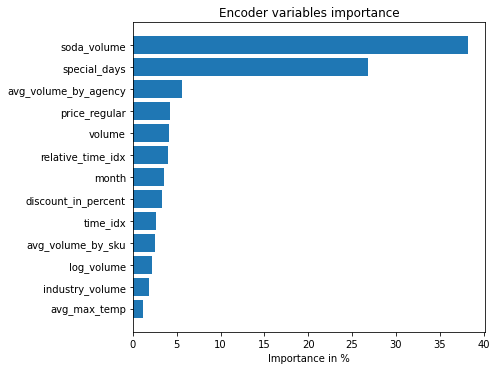

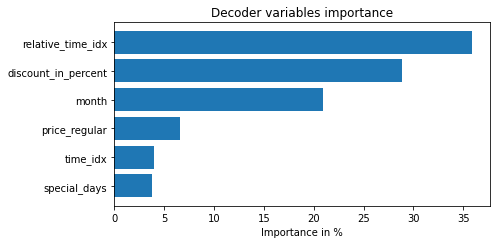

In [100]:
interpretation = best_tft.interpret_output(
    raw_predictions, reduction="sum"
)
best_tft.plot_interpretation(interpretation)

**To do list**
- EDA
- pytorch_lightning 버전이 많이 업데이트되고 코드가 안돌아가는게 좀 있었다.
- pytorch_lightening 에서 LearningRateLogger -> LearningRateMonitor
- https://towardsdatascience.com/introducing-pytorch-forecasting-64de99b9ef46